<a id=toc></a>

<center><h1>Audio | Urban Sound Detection</h1></center>
<div style='border-width: 2px;
              border-bottom-width:4px;
              border-bottom-color:#B6EADA;
              border-bottom-style: solid;'></div>
<br>

<center>
    <figure>
        <img src="https://cdn.dribbble.com/users/6554494/screenshots/15005026/media/b612a68351124f87ff83439b871b5afe.gif" alt ="Audio Art" style='width:80%;'>
        <figcaption>
            Source: Dribbble | <a href="https://dribbble.com/shots/15005026-Sound-Wave-Animation">Sound Wave Animation</a> by <a href="https://dribbble.com/Waqas18">Waqas Awan</a></figcaption>
    </figure>
</center>


## Table of contents
- [1 | Explore Dataset](#1)
   > - [Load sample audio with librosa library](#1.1)
   > - [View sample waveform and spectrogram](#1.2)
   > - [Inspect Datset Labels and Folds](#1.3)
- [2 | Preprocess Data](#2)
   > - [Plot Split Sets Label Distribution](#2.1)
   > - [Define Audio Filepaths](#2.2)
   > - [Get Label Encoded Audio Classes](#2.3)
   > - [Define One-Hot Encoder using tf.one_hot](#2.4)
- [3 | Build Data Input Pipeline with tf.data API](#3)
   > - [What is YAMNet?](#3.1)
   > - [Download YamNet](#3.2)
   > - [Create Data Input Pipeline with Generator](#3.3)
- [4 | Build Model](#4)
- [5 | Train Model](#5)
- [6 | Inspect Model Performance](#6)
   > - [Plot Training History](#6.1)
   > - [Plot Confusion Matrix](#6.2)
   > - [Plot ROC Curve](#6.3)
   > - [View Classification Report](#6.4)
   > - [Inspect Performance Metrics](#6.5)
   > - [View Sample Predictions](#6.6)
- [Conclusion](#conclusion)

## 🎯 Objective
Audio Classification is the task of analysing and assigning a label to an audio recording. It is used for tasks such as speech recognition, music genre classification, and detecting environmental sounds. The objective of this notebook is to build a transfer learning model which is capable of classifying audio recordings of sounds in urban areas. For the sake of simplicity we'll only focus on building a single model in this notebook. 

## 📁 Dataset
The dataset used in this notebook is the UrbanSound8K dataset. This dataset contains 8732 labeled sound excerpts (<=4s) of urban sounds from 10 classes: **air_conditioner, car_horn, children_playing, dog_bark, drilling, enginge_idling, gun_shot, jackhammer, siren, and street_music**. The classes are drawn from the [urban sound taxonomy](https://urbansounddataset.weebly.com/taxonomy.html) and the files are pre-sorted into ten folds (folders named fold1-fold10) to help in the reproduction of and comparison with the automatic classification results reported in the associated dataset paper.


**For more information check out the following links:**
> - [Dataset Page: UrbanSound8K Dataset](https://urbansounddataset.weebly.com/urbansound8k.html)
> - [Paper: A Dataset and Taxonomy for Urban Sound Research](http://www.justinsalamon.com/uploads/4/3/9/4/4394963/salamon_urbansound_acmmm14.pdf)

<center>
    <div class="alert alert-block" style='color:#000000;
           padding: 10px 10px 10px 10px;
           border-radius:10px;
           background-color:#B6EADA;
           font-size:100%;'>  
        <h3><b>Thank you for taking the time to view this notebook!</b></h3>
    </div>
</center>

In [1]:
import random
import os
import glob
import time

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import librosa
from IPython import display

import tensorflow as tf
import tensorflow_hub as hub
from tensorflow.keras import layers, Sequential
from tensorflow.keras.utils import plot_model

from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import classification_report, precision_recall_fscore_support
from sklearn.metrics import accuracy_score, f1_score, matthews_corrcoef
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from scikitplot.metrics import plot_roc

In [2]:
class CFG:
    EPOCHS = 12
    BATCH_SIZE = 32
    SEED = 42
    TF_SEED = 768

<a id="1"></a>

# 1 | Explore Dataset
<div style='border-width: 2px;
              border-bottom-width:4px;
              border-bottom-color:#B6EADA;
              border-bottom-style: solid;'></div>
<br>

<center>
    <figure>
        <img src="https://cdn.dribbble.com/users/720114/screenshots/3750183/media/846a156e10ba5c5d6dcd41d00cbe2c59.gif" alt ="Data Inspection" style='width:50%;'>
        <figcaption>
            Source: Dribbble | <a href="https://dribbble.com/shots/3750183-Data-Inspection">Data Inspection</a> by <a href="https://dribbble.com/MikeMirandi">Mike Mirandi</a></figcaption>
    </figure>
</center>

<br>

In order to build and train a model on a dataset it is import that we first understand what our data looks like. So for this dataset we'll inspect the csv file and audio recordings provided to get an understanding of what the data looks like and to obtain some insights as to how we should go about preprocessing the data in order to begin training a model. 

So let's get started!

In [3]:
# Define paths
DATASET_PATH = "/kaggle/input/urbansound8k/"
DATASET_CSV = "/kaggle/input/urbansound8k/UrbanSound8K.csv"

In [4]:
# Load csv
dataset_df = pd.read_csv(DATASET_CSV)

# View first 20 samples
dataset_df.head(20)

,slice_file_name,fsID,start,end,salience,fold,classID,class
0,100032-3-0-0.wav,100032,0.000000,0.317551,1,5,3,dog_bark
1,100263-2-0-117.wav,100263,58.500000,62.500000,1,5,2,children_playing
2,100263-2-0-121.wav,100263,60.500000,64.500000,1,5,2,children_playing
3,100263-2-0-126.wav,100263,63.000000,67.000000,1,5,2,children_playing
4,100263-2-0-137.wav,100263,68.500000,72.500000,1,5,2,children_playing
5,100263-2-0-143.wav,100263,71.500000,75.500000,1,5,2,children_playing
6,100263-2-0-161.wav,100263,80.500000,84.500000,1,5,2,children_playing
7,100263-2-0-3.wav,100263,1.500000,5.500000,1,5,2,children_playing
8,100263-2-0-36.wav,100263,18.000000,22.000000,1,5,2,children_playing
9,100648-1-0-0.wav,100648,4.823402,5.471927,2,10,1,car_horn


<a id="1.1"></a>

### Load sample audio with librosa library

In [5]:
def view_sample(df, idx):
    print('==============================================')
    print(f"Filename:\t{df['slice_file_name'][idx]}")
    print(f"Fold:\t\t{df['fold'][idx]}")
    print(f"Class:\t\t{df['class'][idx]}\n\n")
    sample_path = DATASET_PATH + f"fold{df['fold'][idx]}/{df['slice_file_name'][idx]}"
    display.display(display.Audio(sample_path, rate=16000))
    print('==============================================')
    return

def generate_spectrogram(waveform, length=255, step=128, fft_length=255):
    # Compute Short-Time Fourier Transform of waveform
    spectrogram = tf.signal.stft(waveform, 
                                frame_length=length, 
                                frame_step=step, 
                                fft_length=fft_length)
    
    # Get magnitude of STFT
    spectrogram = tf.abs(spectrogram)
    
    # Convert spectrogram into image with (height, width, channels) dimensions
    spectrogram = spectrogram[..., tf.newaxis]
    
    return spectrogram

In [6]:
def plot_audio_data(waveform, figsize=(16, 8)):
    fig, (ax1, ax2) = plt.subplots(2, figsize=figsize)
    
    # Plot waveform
    ax1.plot(waveform)
    ax1.set_title('Waveform')
    ax1.set_xlim([0, len(waveform)])
    
    # Plot spectrogram
    #-----------------
    # Generate spectogram from waveform
    spectrogram = generate_spectrogram(waveform) 
    
    # View shapes
    print(f'Waveform shape: {waveform.shape}')
    print(f'Spectrogram shape: {spectrogram.shape}')
    
    # Convert spectrogram shape to 3D if 2D
    if len(spectrogram.shape) > 2:
        assert len(spectrogram.shape) == 3
        spectrogram = np.squeeze(spectrogram, axis=-1)
    
    # Take log of spectrogram (epsillon is added to avoid taking log of 0)
    log_spec = np.log(spectrogram.T + np.finfo(float).eps)
    height = log_spec.shape[0]
    width = log_spec.shape[1]
    
    # Plot Spectrogram
    X = np.linspace(0, np.size(spectrogram), num=width, dtype=int)
    Y = range(height)
    ax2.pcolormesh(X, Y, log_spec)
    ax2.set_title('Spectrogram')
    plt.show()
    
    return

In [7]:
# Select random sample from dataset_df
idx = random.sample(dataset_df.index.to_list(), 1)[0]

# View random sample
view_sample(dataset_df, idx)

Filename:	209992-5-2-77.wav
Fold:		7
Class:		engine_idling




In [8]:
# Generate path of random sample
sample_path = DATASET_PATH + f"fold{dataset_df['fold'][idx]}/{dataset_df['slice_file_name'][idx]}"
sample_path

'/kaggle/input/urbansound8k/fold7/209992-5-2-77.wav'

In [9]:
# Load the selected sample audio data
waveform, sample_rate = librosa.load(sample_path, res_type='kaiser_fast')

<a id="1.2"></a>
### View sample waveform and spectrogram

Waveform shape: (88200,)
Spectrogram shape: (688, 128, 1)


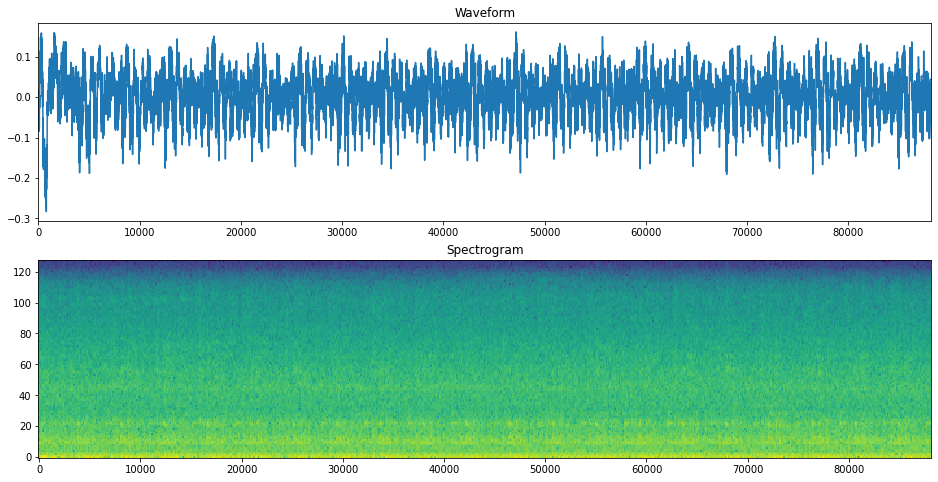

In [10]:
# View Waveform and Spectrogram
plot_audio_data(tf.squeeze(waveform))

<a id="1.3"></a>
### Inspect Datset Labels and Folds

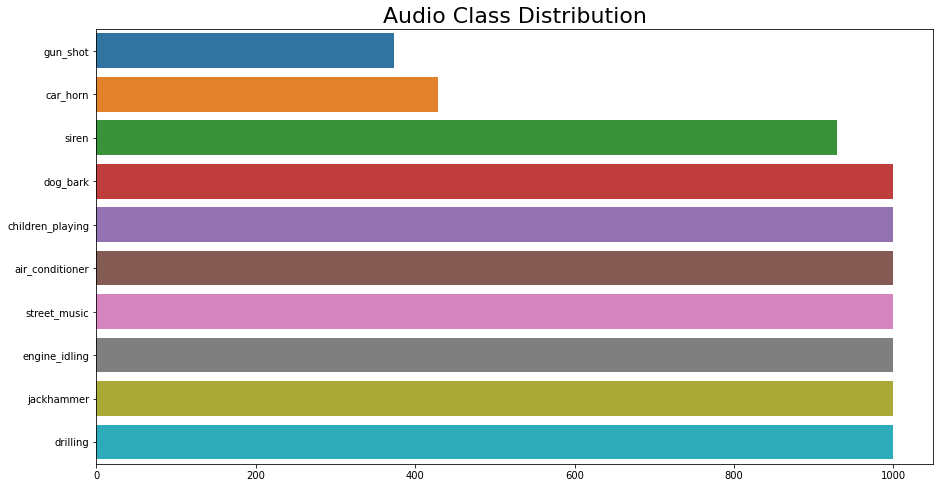

In [11]:
# View Dataset Labels Distribution
plt.figure(figsize=(15, 8))
plt.title('Audio Class Distribution', fontsize=22)
class_distribution = dataset_df['class'].value_counts().sort_values()

sns.barplot(x=class_distribution.values,
            y=list(class_distribution.keys()),
            orient="h");

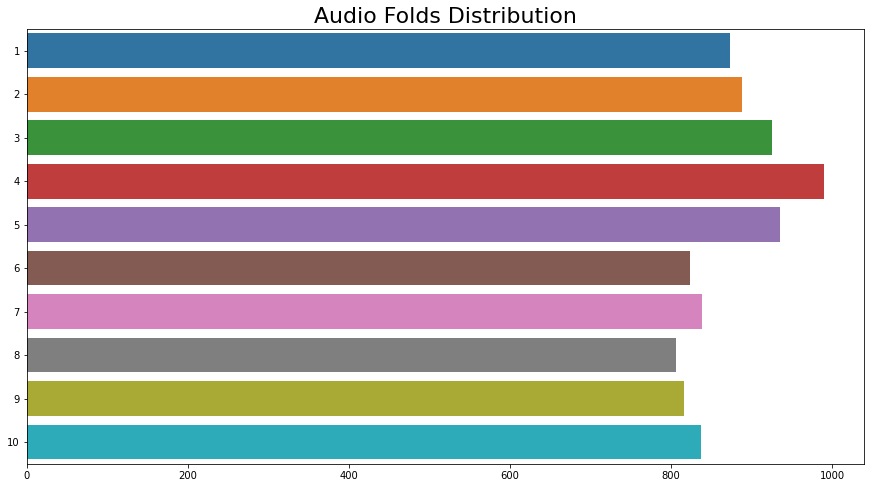

In [12]:
# View Dataset Folds Distribution
plt.figure(figsize=(15, 8))
plt.title('Audio Folds Distribution', fontsize=22)
folds_distribution = dataset_df['fold'].value_counts().sort_index()

sns.barplot(x=folds_distribution.values,
            y=list(folds_distribution.keys()),
            orient="h");

<center><div style='color:#ffffff;
           display:inline-block;
           padding: 5px 5px 5px 5px;
           border-radius:5px;
           background-color:#B6EADA;
           font-size:100%;'><a href=#toc style='text-decoration: none; color:#03001C;'>⬆️ Back To Top</a></div></center>

<a id='2'></a>
    
# 2 | Data Preprocessing
<div style='border-width: 2px;
              border-bottom-width:4px;
              border-bottom-color:#B6EADA;
              border-bottom-style: solid;'></div>
<br>

<center>
    <figure>
        <img src="https://cdn.dribbble.com/users/232239/screenshots/4426960/media/72e6c5c391680b79d8b4f92ea59b536a.gif" alt ="Data Loading Animation" style='width:50%;'>
        <figcaption>
            Source: Dribbble | <a href="https://dribbble.com/shots/3750183-Data-Inspection">Loading Animation for Dashboard
</a> by <a href="https://dribbble.com/omarfaizan">Omar Faizan</a></figcaption>
    </figure>
</center>

<br>

In order to train a model it seems that we will have to create out own train-test splits. We observe that we are given the audio recordings in folds meaning that it is recommended to train a model with cross-validation techniques. However, to avoid adding to the complexity of this notebook we'll create the splits fold-wise instead of randomly selecting samples for the splits. 

In [13]:
# Group folds for splits with lists
train_folds = [1, 2, 3, 4, 5, 6]
val_folds = [7, 8]
test_folds = [9, 10]

In [14]:
# Split main dataset via folds
train_df = dataset_df.loc[dataset_df['fold'].isin(train_folds)]
val_df = dataset_df.loc[dataset_df['fold'].isin(val_folds)]
test_df = dataset_df.loc[dataset_df['fold'].isin(test_folds)]

# View df shapes
train_df.shape, val_df.shape, test_df.shape

((5435, 8), (1644, 8), (1653, 8))

In [15]:
# View training set
train_df.head()

,slice_file_name,fsID,start,end,salience,fold,classID,class
0,100032-3-0-0.wav,100032,0.0,0.317551,1,5,3,dog_bark
1,100263-2-0-117.wav,100263,58.5,62.500000,1,5,2,children_playing
2,100263-2-0-121.wav,100263,60.5,64.500000,1,5,2,children_playing
3,100263-2-0-126.wav,100263,63.0,67.000000,1,5,2,children_playing
4,100263-2-0-137.wav,100263,68.5,72.500000,1,5,2,children_playing


<a id="2.1"></a>
### Plot Split Sets Label Distribution

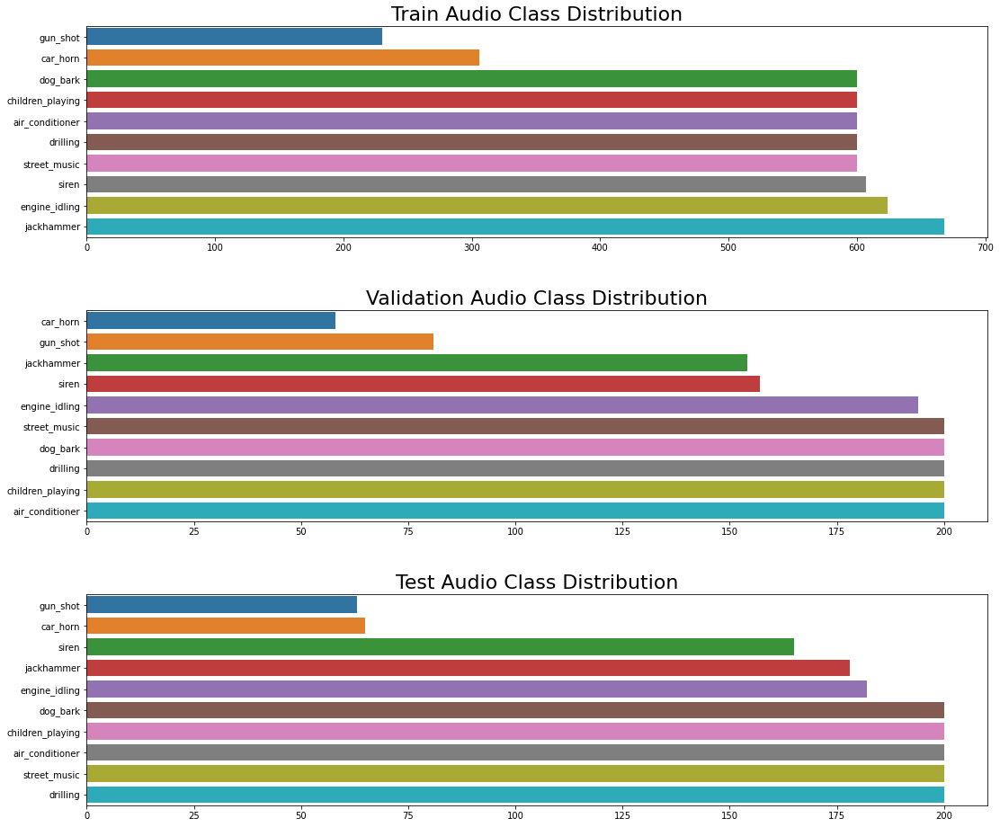

In [16]:
fig, (ax1, ax2, ax3) = plt.subplots(3, figsize=(16, 14))

# Set the spacing between subplots
fig.tight_layout(pad=6.0)

# Plot Train Class Distribution
ax1.set_title('Train Audio Class Distribution', fontsize=22)
train_distribution = train_df['class'].value_counts().sort_values()
sns.barplot(x=train_distribution.values,
            y=list(train_distribution.keys()),
            orient="h",
            ax=ax1)

# Plot Validation Class Distribution
ax2.set_title('Validation Audio Class Distribution', fontsize=22)
val_distribution = val_df['class'].value_counts().sort_values()

sns.barplot(x=val_distribution.values,
            y=list(val_distribution.keys()),
            orient="h",
            ax=ax2)

# Plot Test Class Distribution
ax3.set_title('Test Audio Class Distribution', fontsize=22)
test_distribution = test_df['class'].value_counts().sort_values()

sns.barplot(x=test_distribution.values,
            y=list(test_distribution.keys()),
            orient="h",
            ax=ax3);

In [17]:
# View split sizes
train_len = len(train_df)
val_len = len(val_df)
test_len = len(test_df)
total_len = len(dataset_df)

print(f"Train Set Size:\t\t{train_len}({round(100* train_len/total_len, 3)}%)")
print(f"Validation Set Size:\t{val_len}({round(100* val_len/total_len, 3)}%)")
print(f"Test Set Size:\t\t{test_len}({round(100* test_len/total_len, 3)}%)")
print('------------------------------------')
print(f"Total Samples:\t\t{total_len}(100%)")

Train Set Size:		5435(62.242%)
Validation Set Size:	1644(18.827%)
Test Set Size:		1653(18.93%)
------------------------------------
Total Samples:		8732(100%)


<a id="2.2"></a>

### Define Audio Filepaths

In [18]:
# Generate train audio paths
train_paths = [DATASET_PATH + f"fold{train_df['fold'].iloc[_]}/{train_df['slice_file_name'].iloc[_]}" for _ in range(len(train_df))]

# Generate validation audio paths
val_paths = [DATASET_PATH + f"fold{val_df['fold'].iloc[_]}/{val_df['slice_file_name'].iloc[_]}" for _ in range(len(val_df))]

# Generate test audio paths
test_paths = [DATASET_PATH + f"fold{test_df['fold'].iloc[_]}/{test_df['slice_file_name'].iloc[_]}" for _ in range(len(test_df))]

In [19]:
# View first 10 training audio paths
train_paths[:10]

['/kaggle/input/urbansound8k/fold5/100032-3-0-0.wav',
 '/kaggle/input/urbansound8k/fold5/100263-2-0-117.wav',
 '/kaggle/input/urbansound8k/fold5/100263-2-0-121.wav',
 '/kaggle/input/urbansound8k/fold5/100263-2-0-126.wav',
 '/kaggle/input/urbansound8k/fold5/100263-2-0-137.wav',
 '/kaggle/input/urbansound8k/fold5/100263-2-0-143.wav',
 '/kaggle/input/urbansound8k/fold5/100263-2-0-161.wav',
 '/kaggle/input/urbansound8k/fold5/100263-2-0-3.wav',
 '/kaggle/input/urbansound8k/fold5/100263-2-0-36.wav',
 '/kaggle/input/urbansound8k/fold2/100652-3-0-0.wav']

<a id="2.3"></a>
### Get Label Encoded Audio Classes

In [20]:
# Retrieve encoded labels from main dataset
label_data = dataset_df[['classID', 'class']].value_counts().keys().sort_values()
label_data = dict(label_data)
label_data

{0: 'air_conditioner',
 1: 'car_horn',
 2: 'children_playing',
 3: 'dog_bark',
 4: 'drilling',
 5: 'engine_idling',
 6: 'gun_shot',
 7: 'jackhammer',
 8: 'siren',
 9: 'street_music'}

In [21]:
# Get label encoded audio classes
train_labels_encoded = train_df["classID"].to_numpy()
val_labels_encoded = val_df["classID"].to_numpy()
test_labels_encoded = test_df["classID"].to_numpy()

# Inspect label encoded targets
train_labels_encoded

array([3, 2, 2, ..., 9, 9, 9])

In [22]:
# Get class names and number of classes from label data
num_classes = len(label_data.keys())
class_names = list(label_data.values())

print('==============================================')
print(f'Number of classes: {num_classes}\n')
print(f'Classes:\n{class_names}')
print('==============================================')

Number of classes: 10

Classes:
['air_conditioner', 'car_horn', 'children_playing', 'dog_bark', 'drilling', 'engine_idling', 'gun_shot', 'jackhammer', 'siren', 'street_music']


<a id="2.4"></a>
    
### Define One-Hot Encoder using tf.one_hot

In [23]:
def one_hot_encode(encoded_classes:np.ndarray, num_classes:int):
    return tf.one_hot(encoded_classes, depth=num_classes)

In [24]:
# One-hot encode train labels
train_one_hot = one_hot_encode(train_labels_encoded, num_classes)

# One-hot encode validation labels
val_one_hot = one_hot_encode(val_labels_encoded, num_classes)

# One-hot encode test labels
test_one_hot = one_hot_encode(test_labels_encoded, num_classes)

# View one-hot encodings of train labels
train_one_hot

<tf.Tensor: shape=(5435, 10), dtype=float32, numpy=
array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 1., ..., 0., 0., 0.],
       [0., 0., 1., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 1.],
       [0., 0., 0., ..., 0., 0., 1.],
       [0., 0., 0., ..., 0., 0., 1.]], dtype=float32)>

In [25]:
# View Classes with Encodings
sample_idx = 20
print('Sample Class:\t\t\t', train_df['class'].iloc[sample_idx])
print('Sample Label Encoding:\t\t', train_labels_encoded[sample_idx])
print('Sample One-Hot Encoding:\t', train_one_hot[sample_idx].numpy())

Sample Class:			 air_conditioner
Sample Label Encoding:		 0
Sample One-Hot Encoding:	 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


<center><div style='color:#ffffff;
           display:inline-block;
           padding: 5px 5px 5px 5px;
           border-radius:5px;
           background-color:#B6EADA;
           font-size:100%;'><a href=#toc style='text-decoration: none; color:#03001C;'>⬆️ Back To Top</a></div></center>

<a id='3'></a>
# 3 | Build Data Input Pipeline with tf.data API
<div style='border-width: 2px;
              border-bottom-width:4px;
              border-bottom-color:#B6EADA;
              border-bottom-style: solid;'></div>
<br>

In this notebook we'll use the tf.data API to build input data pipelines for training a model and conducting model inference. In order to achieve this we'll load the waveform of the audio samples and preprocess them by standardizing the audio lengts and precompute the audio embeddings by using YAMNet as the transfer learning model. 

<center>
    <figure>
        <img src="https://i.postimg.cc/GpPNLLNH/1-3-Zi3-VUAYh5w78-KGLo-O37g.webp" alt ="UCF101" style='width: 800px;'>
        <figcaption>
            Image Source: Medium | <a href="https://towardsdatascience.com/how-to-reduce-training-time-for-a-deep-learning-model-using-tf-data-43e1989d2961">How to Reduce Training Time for a Deep Learning Model using tf.data</a>
        </figcaption>
    </figure>
</center>

<a id="3.1"></a>
### What is YAMNet?
YAMNet is a deep neural network model for audio classification developed by Google. It is trained on the [AudioSet-YouTube corpus](https://research.google.com/audioset/), and can recognize a wide range of environmental sounds and music genres. It can classify 521 different sound classes, such as "dog bark," "siren," "guitar," and "violin." The model is designed to be small and fast, making it suitable for use on mobile and embedded devices. YAMNet is also open-sourced by Google, which means that it is available for research and commercial use.

<br>

**For more information on the tf.data API and loading data from generator, follow these links:** 
> - [tf.data: Build TensorFlow input pipelines](https://www.tensorflow.org/guide/data)
> - [Better performance with the tf.data API](https://www.tensorflow.org/guide/data_performance)
> - [Using generators with tf.data API](https://www.tensorflow.org/api_docs/python/tf/data/Dataset#from_generator)

**For more information on the YAMNet and loading TensorFlow Hub, follow these links:** 
> - [Sound classification with YAMNet](https://www.tensorflow.org/hub/tutorials/yamnet)
> - [An Introduction to Transfer Learning](https://georgian.io/an-introduction-to-transfer-learning/)
> - [A Comprehensive Hands-on Guide to Transfer Learning with Real-World Applications in Deep Learning
](https://towardsdatascience.com/a-comprehensive-hands-on-guide-to-transfer-learning-with-real-world-applications-in-deep-learning-212bf3b2f27a)
> - [TensorFlow Hub](https://www.tensorflow.org/hub)
> - [HuggingFace🤗](https://huggingface.co/)

In [26]:
def _load(audio_path: str):
    # Load Audio
    waveform, sample_rate = librosa.load(audio_path, sr=16000, res_type='kaiser_fast', mono=True)
    
    # Pad or Truncate audio to standardize waveform lenght
    waveform = librosa.util.fix_length(waveform, size=32000)
    
    return waveform


# Here's a function to get any model/preprocessor from tensorflow hub
def get_tfhub_model(model_link, model_name, model_trainable=False, input_shape=None):
    return hub.KerasLayer(model_link,
                          trainable=model_trainable,
                          name=model_name)

<a id="3.2"></a>
### Download YamNet

In [27]:
yamnet_url = 'https://tfhub.dev/google/yamnet/1'
model_name = 'yamnet_1'
set_trainable=False # set trainable to False for inference-only 

yamnet = get_tfhub_model(yamnet_url,
                         model_name, 
                         model_trainable=set_trainable)

<a id="3.3"></a>
### Create Data Input Pipeline with Generator

In [28]:
class AudioGenerator:
    '''
    Generates embedding and label pairs of audio files given the paths and one-hot encoded labels.
    
    @params
    - audio_paths: (list[str]) -> paths of audios to be loaded
    - audio_labels: (np.ndarray) -> labels (one-hot encoded) of audios to be loaded
    '''
    def __init__(self, audio_paths, audio_labels):
        self.audio_paths = audio_paths
        self.audio_labels = audio_labels
        
    def get_paths(self):
        return self.audio_paths
    
    def get_labels(self):
        return self.audio_labels
    
    def __len__(self):
        return len(self.audio_labels)
    
    def __call__(self):
        # Get paths and labels
        paths = self.get_paths()
        labels = self.get_labels()
        
        # Zip paths and labels together
        data = list(zip(paths, labels))
        
        # Iterate over paths and labels to yield 
        # loaded embeddings with labels  
        for path, label in data:
            audio =_load(path)
            _, embeddings_output, _ = yamnet(audio)
            
            yield embeddings_output, label

In [29]:
def create_pipeline(audio_paths, audio_labels,
                    batch_size=32, shuffle=False, cache=False, prefetch=False):
    '''
    Generates an input pipeline using the tf.data API given the paths and labels for audio data.
    
    @params
        - audio_paths: (list[str] | np.ndarray) -> Paths to audio files
        - audio_labels: (np.ndarray) -> Audio labels one-hot encoded
        - batch_size: (int) -> size for batched (default=32) 
        - shuffle: (bool) -> condition for data shuffling, data is shuffled when True (default=False)
        - cache: (bool) -> condition for caching data, data is cached in memory when True (default=False)
        - prefetch: (bool) -> condition for prefeching data, data is prefetched when True (default=False)
        
    @returns
        - dataset: (tf.data.Dataset) -> dataset input pipeline used to train a TensorFlow model
    '''
    # Define autotune
    AUTOTUNE = tf.data.AUTOTUNE
    
    
    # Define dataset output signature
    gen_output_signature = (
        tf.TensorSpec(shape=(4, 1024), dtype=tf.float32), 
        tf.TensorSpec(shape=(audio_labels.shape[-1]), dtype=tf.float32)
    )
    
    # Create frames dataset with generator
    ds = tf.data.Dataset.from_generator(
        AudioGenerator(audio_paths, audio_labels),
        output_signature=gen_output_signature
    )
        
    # Apply shuffling based on condition
    if shuffle:
        ds = ds.shuffle(buffer_size=1000)
        
    # Apply batching
    ds = ds.batch(batch_size)
    
    # Apply caching based on condition
    # Note: Do this if the data is small enough to fit in memory!!!
    if cache:
        ds = ds.cache(buffer_size=AUTOTUNE)
    
    # Apply prefetching based on condition
    # Note: This will result in memory trade-offs
    if prefetch:
        ds = ds.prefetch(buffer_size=AUTOTUNE)
    
    # Return the dataset
    return ds

In [30]:
# Generate Datasets
train_ds = create_pipeline(train_paths, train_one_hot, batch_size=32, shuffle=False, prefetch=False)
val_ds = create_pipeline(val_paths, val_one_hot, batch_size=32, shuffle=False, prefetch=False)
test_ds = create_pipeline(test_paths, test_one_hot, batch_size=32, shuffle=False, prefetch=False)

In [31]:
# View train dataset
train_ds

<BatchDataset shapes: ((None, 4, 1024), (None, 10)), types: (tf.float32, tf.float32)>

In [32]:
# View sample shapes
sample_ds_audio, sample_ds_labels = next(iter(train_ds))
print(f'Audio shape: {sample_ds_audio.shape}')
print(f'Labels shape: {sample_ds_labels.shape}')

Audio shape: (32, 4, 1024)
Labels shape: (32, 10)


<center><div style='color:#ffffff;
           display:inline-block;
           padding: 5px 5px 5px 5px;
           border-radius:5px;
           background-color:#B6EADA;
           font-size:100%;'><a href=#toc style='text-decoration: none; color:#03001C;'>⬆️ Back To Top</a></div></center>

<a id='4'></a>
# 4 | Build Model
<div style='border-width: 2px;
              border-bottom-width:4px;
              border-bottom-color:#B6EADA;
              border-bottom-style: solid;'></div>
<br>

For this model we'll use the audio waveform embeddings as input. We'll pass this input into a Bi-Directional LSTM and connect it to a classification head (Dense Layer). To prevent overfitting we'll add a Dropout Layer with a dropout rate of 0.25 before the classification head. This model is fairly simple and is used to maintain low memory consumption. 

<center>
    <figure>
        <img src="https://i.postimg.cc/7YHJZmW9/ELMo-bi-LSTM.png" alt ="UCF101" style='width: 500px;'>
        <figcaption>
            Image Source: <a href="https://lilianweng.github.io/posts/2019-01-31-lm/">[GitHub: Generalized Language Models]</a>
        </figcaption>
    </figure>
</center>

<br>

**For more information on the Functional API and model layers, follow these links:** 
> - [TensorFlow Functional API](https://www.tensorflow.org/guide/keras/functional)
> - [TensorFlow LSTM Layer](https://www.tensorflow.org/api_docs/python/tf/keras/layers/LSTM)
> - [TensorFlow Dropout Layer](https://www.tensorflow.org/api_docs/python/tf/keras/layers/Dropout)
> - [TensorFlow Dense Layer](https://www.tensorflow.org/api_docs/python/tf/keras/layers/Dense)

In [33]:
def build_model(num_labels):
    # Define kernel initializer
    initializer = tf.keras.initializers.GlorotNormal()
    
    # Input Layer
    audio = layers.Input(shape=(4, 1024), dtype=tf.float32, name='audio_input')
    
    # LSTM Layer
    audio_lstm = layers.Bidirectional(layers.LSTM(128, kernel_initializer=initializer))(audio)
    
    # Apply Dropout
    audio_dropout = layers.Dropout(0.25)(audio_lstm)
    
    # Compute classification probabilities
    output_layer = layers.Dense(num_labels, activation='softmax', 
                                kernel_initializer=initializer, 
                                name='output_layer')(audio_dropout)
    
    return tf.keras.Model(inputs=[audio], 
                          outputs=[output_layer], name="audio_classifier_model")

In [34]:
# Generate Model
audio_model = build_model(num_classes)

# Generate Summary of the Model
audio_model.summary()

Model: "audio_classifier_model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
audio_input (InputLayer)     [(None, 4, 1024)]         0         
_________________________________________________________________
bidirectional (Bidirectional (None, 256)               1180672   
_________________________________________________________________
dropout (Dropout)            (None, 256)               0         
_________________________________________________________________
output_layer (Dense)         (None, 10)                2570      
Total params: 1,183,242
Trainable params: 1,183,242
Non-trainable params: 0
_________________________________________________________________


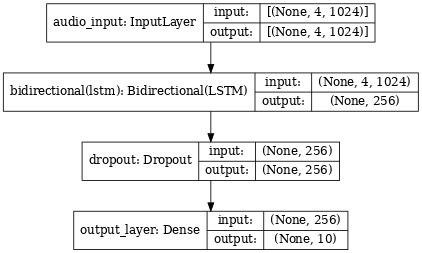

In [35]:
# Explore model visually
plot_model(
    audio_model, dpi=60,
    show_shapes=True
)

<center><div style='color:#ffffff;
           display:inline-block;
           padding: 5px 5px 5px 5px;
           border-radius:5px;
           background-color:#B6EADA;
           font-size:100%;'><a href=#toc style='text-decoration: none; color:#03001C;'>⬆️ Back To Top</a></div></center>
           
<a id='5'></a>
# 5 | Train Model
<div style='border-width: 2px;
              border-bottom-width:4px;
              border-bottom-color:#B6EADA;
              border-bottom-style: solid;'></div>
<br>

<center>
    <figure>
        <img src="https://media2.giphy.com/media/v1.Y2lkPTc5MGI3NjExMzYzMzU3OWE2NmQwOTg3MzZmNGJjNWZiZjRjOTAwMDVmMGMxNGVlZiZlcD12MV9pbnRlcm5hbF9naWZzX2dpZklkJmN0PWc/PjJ1cLHqLEveXysGDB/giphy.gif" alt ="UCF101" style='width: 40%;'>
        <figcaption>
            Source: Giphy | <a href="https://giphy.com/gifs/digital-brain-ai-PjJ1cLHqLEveXysGDB">Glow Machine Learning</a> by <a href="https://giphy.com/xponentialdesign">xponentialdesign</a>
        </figcaption>
    </figure>
</center>

<br>

To train this model we'll use Categorical Crossentropy as the loss function since this is a multi-classification problem. For the optimizer we'll use the Adam optimizer with 0.001 as the (default) learning rate. 

To prevent the occurance of overfitting during training we'll have to make use of TensorFlow's Callback API to implement the EarlyStopping & ReduceLROnPlateau callbacks. The only metrics we'll track during the training of the model will be the loss and accuracy metrics.

<br>

**See the following for more information:**
>- **Categorical Crossentropy Loss Function:**
>    - [Understanding Categorical Cross-Entropy Loss, Binary Cross-Entropy Loss, Softmax Loss, Logistic Loss, Focal Loss and all those confusing names](https://gombru.github.io/2018/05/23/cross_entropy_loss/)
>    - [TensorFlow Categorical Crossentropy Loss Implementation](https://www.tensorflow.org/api_docs/python/tf/keras/losses/CategoricalCrossentropy)
>- **Adam Optimizer:**
>    - [Academic Paper | Adam: A Method for Stochastic Optimization](https://arxiv.org/abs/1412.6980)
>    - [TensorFlow Adam Implementation](https://www.tensorflow.org/api_docs/python/tf/keras/optimizers/Adam)
>- **TensorFlow Callback API:**
>    - [EarlyStopping Implementation](https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping)
>    - [ReduceLROnPlateau Implementation](https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/ReduceLROnPlateau)
>- **TensorFlow Metrics:**
>    - [TensorFlow Metrics Overview](https://www.tensorflow.org/api_docs/python/tf/keras/metrics)

In [36]:
# Define early stopping callback
early_stopping_callback = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss', 
    patience=3, 
    restore_best_weights=True)

# Define reduce learning rate callback
reduce_lr_callback = tf.keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    patience=2,
    factor=0.1,
    verbose=1)

# Define callbacks and metrics lists
CALLBACKS = [early_stopping_callback, reduce_lr_callback]
METRICS = ['accuracy']

In [37]:
# Set tf seed
tf.random.set_seed(CFG.SEED)

# Compile the model
audio_model.compile(
    loss=tf.keras.losses.CategoricalCrossentropy(label_smoothing=0.1),
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    metrics=METRICS
)

# Train the model 
print(f'Training {audio_model.name}.')
print(f'Train on {len(train_df)} samples, validate on {len(val_df)} samples.')
print('----------------------------------')

audio_model_history = audio_model.fit(
    train_ds,
    epochs = CFG.EPOCHS,
    validation_data=val_ds,
    callbacks=CALLBACKS)

Training audio_classifier_model.
Train on 5435 samples, validate on 1644 samples.
----------------------------------
Epoch 1/12
170/170 [==============================] - 518s 3s/step - loss: 1.4239 - accuracy: 0.6015 - val_loss: 1.0994 - val_accuracy: 0.7372
Epoch 2/12
170/170 [==============================] - 378s 2s/step - loss: 1.0077 - accuracy: 0.7866 - val_loss: 1.0513 - val_accuracy: 0.7682
Epoch 3/12
170/170 [==============================] - 376s 2s/step - loss: 0.9182 - accuracy: 0.8318 - val_loss: 1.0471 - val_accuracy: 0.7737
Epoch 4/12
170/170 [==============================] - 378s 2s/step - loss: 0.8599 - accuracy: 0.8572 - val_loss: 1.0591 - val_accuracy: 0.7780
Epoch 5/12
170/170 [==============================] - 379s 2s/step - loss: 0.8140 - accuracy: 0.8800 - val_loss: 1.0939 - val_accuracy: 0.7682

Epoch 00005: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
Epoch 6/12
170/170 [==============================] - 377s 2s/step - loss: 0.7579 - ac

In [38]:
# Evaluate the model
audio_model_evaluation = audio_model.evaluate(test_ds)

52/52 [==============================] - 124s 2s/step - loss: 1.0203 - accuracy: 0.8070


In [39]:
# Generate model probabilities and predictions
test_probabilities = audio_model.predict(test_ds, verbose=1)
test_predictions = tf.argmax(test_probabilities, axis=1)

52/52 [==============================] - 91s 2s/step


<center><div style='color:#ffffff;
           display:inline-block;
           padding: 5px 5px 5px 5px;
           border-radius:5px;
           background-color:#B6EADA;
           font-size:100%;'><a href=#toc style='text-decoration: none; color:#03001C;'>⬆️ Back To Top</a></div></center>

<a id='6'></a>
# 6 | Inspect Model Performance
<div style='border-width: 2px;
              border-bottom-width:4px;
              border-bottom-color:#B6EADA;
              border-bottom-style: solid;'></div>
<br>

Now that the model has trained on the data we need to inspect how well it performs on the unseen test data. In order to conduct this inspection we need to evaluate the performance of the model on the test data and record evaluation metrics. We'll make use of the Scikit Learn library to inspect the model. We'll also use the following to inspect the model:

>- [Classification Report](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.classification_report.html#sklearn.metrics.classification_report)
>- [Accuracy Score](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.accuracy_score.html#sklearn.metrics.accuracy_score)
>- [Precision](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.precision_score.html#sklearn.metrics.precision_score)
>- [Recall](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.recall_score.html#sklearn.metrics.recall_score)
>- [F1-score](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.f1_score.html#sklearn.metrics.f1_score) 
>- [Matthews Correlation Coefficient](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.matthews_corrcoef.html)

<a id="6.1"></a>
### Plot Training History

In [40]:
def plot_training_curves(history):
    
    loss = np.array(history.history['loss'])
    val_loss = np.array(history.history['val_loss'])

    accuracy = np.array(history.history['accuracy'])
    val_accuracy = np.array(history.history['val_accuracy'])

    epochs = range(1, len(history.history['loss']) + 1)

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))

    # Plot loss
    ax1.plot(epochs, loss, label='training_loss', marker='o')
    ax1.plot(epochs, val_loss, label='val_loss', marker='o')
    
    ax1.fill_between(epochs, loss, val_loss, where=(loss > val_loss), color='C0', alpha=0.3, interpolate=True)
    ax1.fill_between(epochs, loss, val_loss, where=(loss < val_loss), color='C1', alpha=0.3, interpolate=True)

    ax1.set_title('Loss (Lower Means Better)', fontsize=16)
    ax1.set_xlabel('Epochs', fontsize=12)
    ax1.legend()

    # Plot accuracy
    ax2.plot(epochs, accuracy, label='training_accuracy', marker='o')
    ax2.plot(epochs, val_accuracy, label='val_accuracy', marker='o')
    
    ax2.fill_between(epochs, accuracy, val_accuracy, where=(accuracy > val_accuracy), color='C0', alpha=0.3, interpolate=True)
    ax2.fill_between(epochs, accuracy, val_accuracy, where=(accuracy < val_accuracy), color='C1', alpha=0.3, interpolate=True)

    ax2.set_title('Accuracy (Higher Means Better)', fontsize=16)
    ax2.set_xlabel('Epochs', fontsize=12)
    ax2.legend();

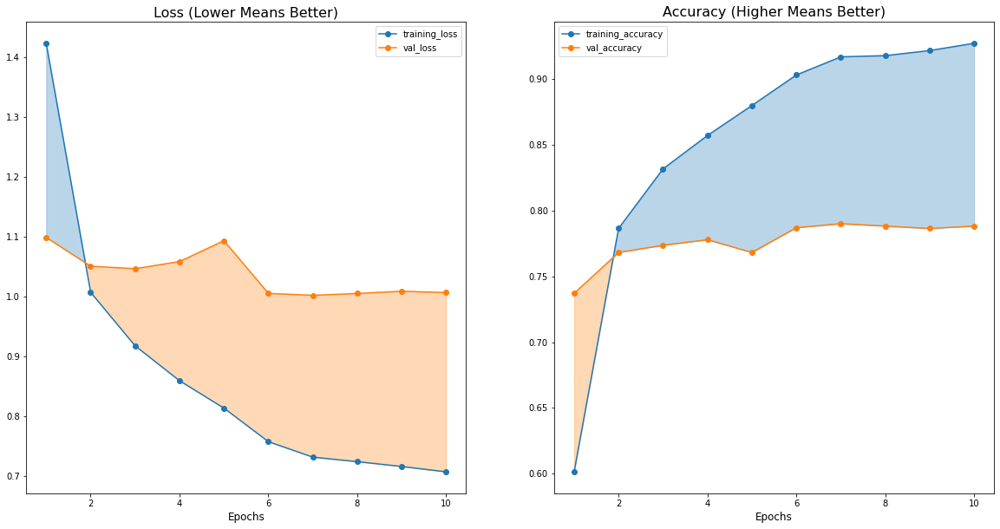

In [41]:
# Plot model training history
plot_training_curves(audio_model_history)

<a id="6.2"></a>
### Plot Confusion Matrix

In [42]:
def plot_confusion_matrix(y_true, y_pred, classes='auto', figsize=(10, 10), text_size=12): 
    # Generate confusion matrix 
    cm = confusion_matrix(y_true, y_pred)
    
    # Set plot size
    plt.figure(figsize=figsize)

    # Create confusion matrix heatmap
    disp = sns.heatmap(
        cm, annot=True, cmap='Greens',
        annot_kws={"size": text_size}, fmt='g',
        linewidths=1, linecolor='black', clip_on=False,
        xticklabels=classes, yticklabels=classes)
    
    # Set title and axis labels
    disp.set_title('Confusion Matrix', fontsize=24)
    disp.set_xlabel('Predicted Label', fontsize=20) 
    disp.set_ylabel('True Label', fontsize=20)
    plt.yticks(rotation=0) 

    # Plot confusion matrix
    plt.show()
    
    return

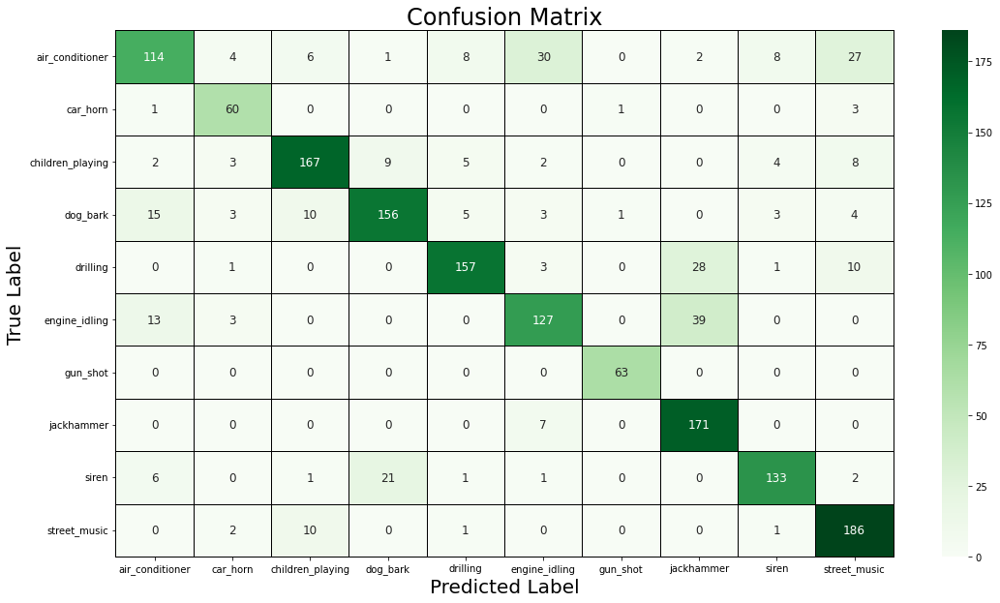

In [43]:
# View Confusion Matrix
plot_confusion_matrix(
    test_labels_encoded, 
    test_predictions, 
    figsize=(18, 10), 
    classes=class_names)

<div class="alert alert-block alert-info">
    <h3>Observation</h3>
    The model seems to classify most unseen samples correctly. However, some samples are misclassified into similar labels, e.g. samples from the <b>jackhammer</b> class are frequently misclassified as either <b>engine_idiling</b> or <b>driling</b>. This could be due to these classes having overlapping features that make it difficult for the model to distinguise between these audio classes. Another reason could be that some audio recordings have features representing multiple audio classes, e.g. an audio recording contains sounds of <b>jackhammer</b> and <b>drilling</b> or <b>street music</b> and <b>air conditioner</b>.  
</div>

<a id="6.3"></a>
### Plot ROC Curve

An ROC (Receiver Operating Characteristic) curve is a graphical plot that illustrates the diagnostic ability of a classifier system as its discrimination threshold is varied. The curve is created by plotting the true positive rate (TPR) on the Y-axis against the false positive rate (FPR) on the X-axis at various classification thresholds.

<center>
    <figure>
        <img src="https://i.postimg.cc/XJtrYZgF/roc-curve.jpg" alt ="ROC Curve" style='width: 500px;'>
        <figcaption>
            Image Source: <a href="https://medium.datadriveninvestor.com/understanding-auc-roc-clearly-explained-74c53d292a02">[Medium: Understanding AUC-ROC: Clearly explained]</a></figcaption>
    </figure>
</center>

<br>

For more information see the following:
> - [What is a ROC Curve, and How Do You Use It in Performance Modeling?](https://www.simplilearn.com/what-is-a-roc-curve-and-how-to-use-it-in-performance-modeling-article)
> - [Receiver operating characteristic](https://en.wikipedia.org/wiki/Receiver_operating_characteristic)
> - [Understanding AUC-ROC: Clearly explained](https://medium.datadriveninvestor.com/understanding-auc-roc-clearly-explained-74c53d292a02)

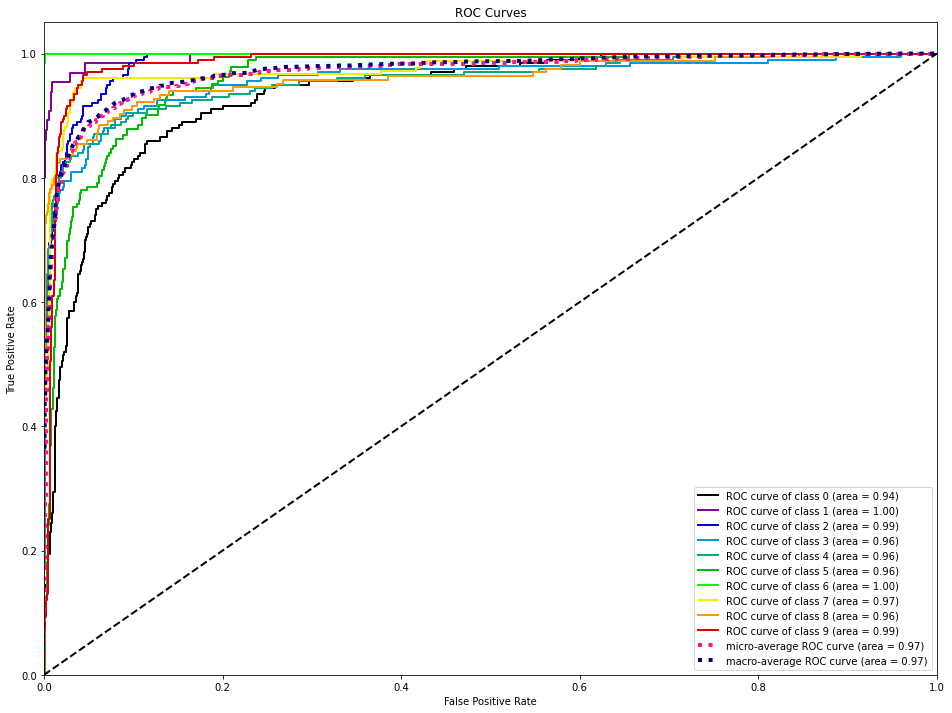

In [44]:
plot_roc(test_labels_encoded, 
         test_probabilities, 
         figsize=(16, 12), 
         title_fontsize='large');

<a id="6.4"></a>
### View Classification Report

In [45]:
print(classification_report(test_labels_encoded, 
                            test_predictions, 
                            target_names=class_names))

                  precision    recall  f1-score   support

 air_conditioner       0.75      0.57      0.65       200
        car_horn       0.79      0.92      0.85        65
children_playing       0.86      0.83      0.85       200
        dog_bark       0.83      0.78      0.81       200
        drilling       0.89      0.79      0.83       200
   engine_idling       0.73      0.70      0.72       182
        gun_shot       0.97      1.00      0.98        63
      jackhammer       0.71      0.96      0.82       178
           siren       0.89      0.81      0.84       165
    street_music       0.78      0.93      0.85       200

        accuracy                           0.81      1653
       macro avg       0.82      0.83      0.82      1653
    weighted avg       0.81      0.81      0.80      1653



<a id="6.5"></a>
### Inspect Performance Metrics

In [46]:
def generate_performance_scores(y_true, y_pred, y_probabilities):
    
    model_accuracy = round(accuracy_score(y_true, y_pred), 5)
    model_precision, model_recall, model_f1, _ = precision_recall_fscore_support(y_true, 
                                                                                 y_pred, 
                                                                                 average="weighted")
    model_matthews_corrcoef = round(matthews_corrcoef(y_true, y_pred), 5)
    
    print('=============================================')
    print(f'\nPerformance Metrics:\n')
    print('=============================================')
    print(f'accuracy_score:\t\t{model_accuracy}\n')
    print('_____________________________________________')
    print(f'precision_score:\t{model_precision}\n')
    print('_____________________________________________')
    print(f'recall_score:\t\t{model_recall}\n')
    print('_____________________________________________')
    print(f'f1_score:\t\t{model_f1}\n')
    print('_____________________________________________')
    print(f'matthews_corrcoef:\t{model_matthews_corrcoef}\n')
    print('=============================================')
    
    performance_scores = {
        'accuracy_score': model_accuracy,
        'precision_score': model_precision,
        'recall_score': model_recall,
        'f1_score': model_f1,
        'matthews_corrcoef': model_matthews_corrcoef
    }
    return performance_scores


In [47]:
# View Performance Metrics
audio_model_performance = generate_performance_scores(
    test_labels_encoded, 
    test_predictions, 
    test_probabilities)


Performance Metrics:

accuracy_score:		0.80702

_____________________________________________
precision_score:	0.8115630006158854

_____________________________________________
recall_score:		0.8070175438596491

_____________________________________________
f1_score:		0.8039270023252733

_____________________________________________
matthews_corrcoef:	0.78487



<a id="6.6"></a>
### View Sample Predictions

Let's generate and view some prediction to see how to model performs.

In [48]:
def predict_audio(model, audio_waveform):
    # Get waveform embedding 
    _, embedding, _ = yamnet(audio_waveform)
    
    # Generate prediction
    probabilities = model(np.array([embedding]))
    prediction = class_names[np.argmax(probabilities)]
    
    # Return results
    return prediction, np.squeeze(probabilities.numpy())

In [54]:
# Select random sample from dataset_df
idx = random.sample(test_df.index.to_list(), 10)

# Generate sample path
sample_paths = [DATASET_PATH + f"fold{dataset_df['fold'][_]}/{dataset_df['slice_file_name'][_]}" for _ in idx]

# Load audio and generate prediction
sample_waveforms = [_load(path) for path in sample_paths]
results = [predict_audio(audio_model, waveform) for waveform in sample_waveforms]

In [55]:
index = 0

# View Predictions
for _ in idx:
    pred, prob = results[index]
    
    print(f"Filename:\t\t{test_df['slice_file_name'][_]}\n")
    print(f"Class:\t\t\t{test_df['class'][_]}")
    print(f"Predicted Class:\t{pred}")
    print(f"Probability:\t\t{prob[np.argmax(prob)]:.4f}\n")
    display.display(display.Audio(sample_paths[index], rate=16000))
    print('==============================================')
    
    index +=1

Filename:		96921-9-0-1.wav

Class:			street_music
Predicted Class:	street_music
Probability:		0.6076



Filename:		155262-2-0-101.wav

Class:			children_playing
Predicted Class:	children_playing
Probability:		0.9397



Filename:		188497-2-0-8.wav

Class:			children_playing
Predicted Class:	children_playing
Probability:		0.3614



Filename:		101729-0-0-1.wav

Class:			air_conditioner
Predicted Class:	air_conditioner
Probability:		0.9782



Filename:		128470-3-0-1.wav

Class:			dog_bark
Predicted Class:	children_playing
Probability:		0.8205



Filename:		30344-3-0-3.wav

Class:			dog_bark
Predicted Class:	dog_bark
Probability:		0.9125



Filename:		85661-3-0-0.wav

Class:			dog_bark
Predicted Class:	dog_bark
Probability:		0.9447



Filename:		28808-1-0-9.wav

Class:			car_horn
Predicted Class:	car_horn
Probability:		0.9716



Filename:		105029-7-2-9.wav

Class:			jackhammer
Predicted Class:	jackhammer
Probability:		0.9427



Filename:		101729-0-0-24.wav

Class:			air_conditioner
Predicted Class:	air_conditioner
Probability:		0.9413



<center><div style='color:#ffffff;
           display:inline-block;
           padding: 5px 5px 5px 5px;
           border-radius:5px;
           background-color:#B6EADA;
           font-size:100%;'><a href=#toc style='text-decoration: none; color:#03001C;'>⬆️ Back To Top</a></div></center>

<a id='conclusion'></a>
# <center>Conclusion</center>
<div style='border-width: 2px;
              border-bottom-width:4px;
              border-bottom-color:#B6EADA;
              border-bottom-style: solid;'></div>
<br>

In this notebook we built a audio classification model with transfer learning with the use of the UrbanSound8K dataset. We achieved this by means of preprocessing the data, using input data pipelines for training and inference and using YAMNet as the transfer learning backbone model to generate audio embeddings which was used to train the model in this notebook.

The model obtained a fairly high Matthews Correlation Coefficient (MMC) which implies that the model will generalise to unseen samples since a high MCC implies that model's predictions are statistically of high quality. However, since this model has a basic architecture there is still room for improvement.

### Suggestions For Improving Model Performance

The model explored in this notebook does not perform good enough to be considered as a SOTA performing model on the task of classifying sounds from urban areas and there is plenty of room for improvement. The following should be considered:

- **Using audio spectrograms along with embeddings as input:** An audio spectrogram is a visual representation of the frequency content of a sound signal over time and is created by applying a Short-Time Fourier Transform (STFT) to a segment of the audio, and then plotting the magnitude of the resulting complex numbers in a 2D graph, with time on the x-axis and frequency on the y-axis. By using audio spectrograms generated from the dataset's audio recordings along with the YAMNet embeddings we will be able to build a model capable of generating better classifications. However, note that this may require more computational resources.

- **Using a larger model:** The model used in this notebook is fairly simple and may not be as efficient at learning the necessary patterns required to generate the correct classification in some instances. Adding more weights or using a different architechture may prove to be benificial.

- **Using Ensembling methods:** Ensembling is a powerfull technique which allows for the pooling of knowledge from various models all trained to solve the same problem (much like transfer learning). Improved results may be achived through ensembling techniques at the expense of higher a inference rate, however, more trained models are required for this approach but it is worth consideration.

<div class="alert alert-block" style='color:#000000;
           padding: 10px 10px 10px 10px;
           border-radius:10px;
           background-color:#B6EADA;
           font-size:100%;'>  
    <center><h2><b>To you, the notebook visitor...</b></h2>
    <b>It takes a lot of effort and time from me to create my notebooks. 
    <br>
    So, if you <u>FORK or found this notebook HELPFUL</u>, please consider supporting me with an upvote! 
    <br>
    I truly appreciate your time and attention!</b>
<h3>Once again, thank you for visiting my notebook!🙏</h3></center>
</div>